# Memory Chips + Words

En esta notebook haremos un intento de ver palabras que efectúen algún tipo de activación sobre grupos de neuronas

Usaremos como base este paper

["Understanding hidden memories of recurrent neural networks"](https://arxiv.org/abs/1710.10777)

In [1]:
%load_ext autoreload
%autoreload 2
import pandas as pd
import csv
import numpy as np
import tensorflow as tf
import random
import torch

torch.manual_seed(2019)
np.random.seed(2019)
tf.random.set_random_seed(2019)
random.seed(2019)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

df_dev = pd.read_table("../../../data/es/dev_es.tsv", index_col="id", quoting=csv.QUOTE_NONE)
df_train = pd.read_table("../../../data/es/train_es.tsv", index_col="id", quoting=csv.QUOTE_NONE)
df_test = pd.read_table("../../../data/es/reference_es.tsv", header=None, 
                        names=["text", "HS", "TR", "AG"], quoting=csv.QUOTE_NONE)


text_train, y_train = df_train["text"], df_train["HS"]
text_dev, y_dev = df_dev["text"], df_dev["HS"]
text_test, y_test = df_test["text"], df_test["HS"]

print("Instancias de entrenamiento: {}".format(len(df_train)))
print("Instancias de desarrollo: {}".format(len(df_dev)))
print("Instancias de test: {}".format(len(df_test)))


Instancias de entrenamiento: 4500
Instancias de desarrollo: 500
Instancias de test: 1600


Cargamos datos dev con anotaciones propias

In [2]:
df_dev = pd.read_csv("dev_with_annotations.es.csv", index_col="id")

df_dev = df_dev[df_dev["text"].notnull()]


Cargamos modelos de fasttext y ELMo

In [3]:
%%capture
from elmoformanylangs import Embedder
import fastText
import os


fasttext_model = fastText.load_model(os.path.expanduser("../../../WordVectors/UBA_w3_300.bin"))
elmo_embedder = Embedder("../../../models/elmo/es/")

## GRU + Global Average Pooling

We use a model with a BiLSTM + an average pooling (this is controlled by the `pooling` argument to the ElmoModel)

In [8]:
from hate.nn import ElmoModel
from keras.optimizers import Adam
from keras.layers import LSTM, GRU, CuDNNLSTM, CuDNNGRU
max_length = 40

def MyRecClass(*args, **kwargs):
    kwargs.update({
        'activation': 'sigmoid'
    })
    
    return GRU(*args, **kwargs)

model = ElmoModel(
    max_length, fasttext_model=fasttext_model,
    elmo_embedder=elmo_embedder,
    recursive_class=CuDNNGRU,
    rnn_units=250, dropout=0.0,
    pooling='avg',
    tokenize_args = {
        "preserve_case": False,
        "deaccent": False,
        "reduce_len": True,
        "strip_handles": True,
        "alpha_only": False,
        "stem": False
    }
)

#model.load_weights("../../../models/lstm_elmo.h5")
print(model.summary())

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Elmo (InputLayer)               (None, 40, 1024)     0                                            
__________________________________________________________________________________________________
Fasttext (InputLayer)           (None, 40, 300)      0                                            
__________________________________________________________________________________________________
concatenate_3 (Concatenate)     (None, 40, 1324)     0           Elmo[0][0]                       
                                                                 Fasttext[0][0]                   
__________________________________________________________________________________________________
cu_dnngru_5 (CuDNNGRU)          (None, 40, 250)      1182000     concatenate_3[0][0]              
__________

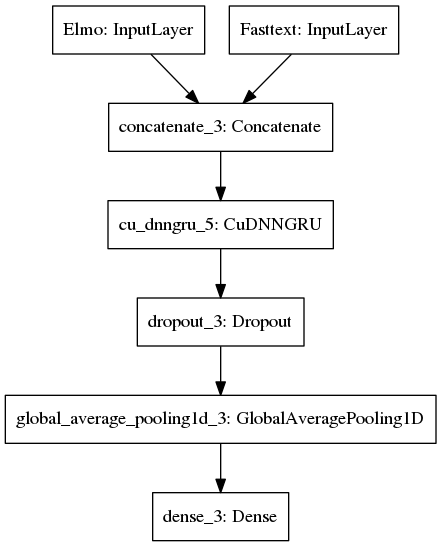

In [11]:
from keras.utils import plot_model
from IPython.display import Image
plot_model(model, to_file='model.png')


Image(filename='model.png') 

In [14]:

optimizer_args = {
    "lr": 0.001,
    "decay": 0.01,
}

model.compile(loss='binary_crossentropy', 
              optimizer=Adam(**optimizer_args), 
              metrics=['accuracy'])

¿Cómo anda el tokenizador?

In [15]:
from keras.callbacks import ModelCheckpoint, EarlyStopping

checkpointer = ModelCheckpoint('/tmp/lstm_model.h5', save_best_only=True, monitor='val_acc', verbose=1)
early_stopper = EarlyStopping(monitor='val_loss', patience=10)


model.fit(text_train, y_train, 
          callbacks=[checkpointer, early_stopper],
          validation_data=(text_dev, y_dev), epochs=100, batch_size=32)


Train on 4500 samples, validate on 500 samples
Epoch 1/100
4500/4500 [==============================] - 4s 880us/step - loss: 0.5993 - acc: 0.6911 - val_loss: 0.4534 - val_acc: 0.7980

Epoch 00001: val_acc improved from -inf to 0.79800, saving model to /tmp/lstm_model.h5
Epoch 2/100
4500/4500 [==============================] - 2s 391us/step - loss: 0.4192 - acc: 0.8073 - val_loss: 0.4152 - val_acc: 0.8120

Epoch 00002: val_acc improved from 0.79800 to 0.81200, saving model to /tmp/lstm_model.h5
Epoch 3/100
4500/4500 [==============================] - 2s 402us/step - loss: 0.3455 - acc: 0.8476 - val_loss: 0.4712 - val_acc: 0.7620

Epoch 00003: val_acc did not improve from 0.81200
Epoch 4/100
4500/4500 [==============================] - 2s 400us/step - loss: 0.2991 - acc: 0.8684 - val_loss: 0.4326 - val_acc: 0.7860

Epoch 00004: val_acc did not improve from 0.81200
Epoch 5/100
4500/4500 [==============================] - 2s 399us/step - loss: 0.2475 - acc: 0.8951 - val_loss: 0.4252 - val

In [69]:
from hate.utils import print_evaluation
print("{} -- \n\n".format(model.display_name))
print("Evaluación sobre dev")

model.load_weights(checkpointer.filepath)

print_evaluation(model, text_dev, y_dev)
print("\nEvaluación sobre test")

print_evaluation(model, text_test, y_test)

CuDNNGRU with avg pooling consuming ELMo + FastText -- 


Evaluación sobre dev
500/500 [==============================] - 0s 197us/step
Loss           : 0.6713
Accuracy       : 0.8340
Precision(1)   : 0.8465
Precision(1)   : 0.8289
Precision(avg) : 0.8377

Recall(1)      : 0.7703
Recall(0)      : 0.8885
Recall(avg)    : 0.8294

F1(1)          : 0.8066
F1(0)          : 0.8576
F1(avg)        : 0.8321

Evaluación sobre test
1600/1600 [==============================] - 0s 181us/step
Loss           : 1.0947
Accuracy       : 0.7369
Precision(1)   : 0.6804
Precision(1)   : 0.7741
Precision(avg) : 0.7272

Recall(1)      : 0.6773
Recall(0)      : 0.7766
Recall(avg)    : 0.7269

F1(1)          : 0.6788
F1(0)          : 0.7754
F1(avg)        : 0.7271


## Error Analysis

Vamos a ver los tweets con mayores errores

In [17]:
df_dev["proba"] = model.predict(text_dev)
df_dev["PROFANITY"] = 0


true_positives = df_dev[(df_dev["HS"] == 1) & (df_dev["proba"] >= 0.5)].copy()
true_negatives = df_dev[(df_dev["HS"] == 0) & (df_dev["proba"] < 0.5)].copy()

false_positives = df_dev[(df_dev["HS"] == 0) & (df_dev["proba"] > 0.5)].copy()
false_positives.sort_values("proba", ascending=False, inplace=True)


false_negatives = df_dev[(df_dev["HS"] == 1) & (df_dev["proba"] < 0.5)].copy()
false_negatives.sort_values("proba", ascending=True, inplace=True)

conf_matrix = pd.DataFrame([
    {"real":"hs=1", "pred_true": len(true_positives), "pred_false": len(false_negatives)},
    {"real":"hs=0", "pred_true": len(false_positives), "pred_false": len(true_negatives)}
])



conf_matrix.set_index("real", inplace=True)

print("Falsos negativos: {}".format(len(false_negatives)))
print("Falsos positivos: {}".format(len(false_positives)))

conf_matrix[["pred_true", "pred_false"]]

Falsos negativos: 51
Falsos positivos: 32


,pred_true,pred_false
real,,
hs=1,171,51
hs=0,32,246


## Activations

Cortamos las otras capas, y vemos qué está saliendo de la capa recurrente. Para eso, armamos un modelo intermedio

In [18]:
from keras.models import Model
    

interm_model = Model(inputs=model.inputs, outputs=[model.recursive_layer])

¿Cómo afecta cada una de las palabras a las distintas neuronas?

Para calcular eso, vamos a estimar para cada palabra $x$ la respuesta promedio de la capa recurrente

\begin{align}
s(x) &= E(\Delta h^{(t)}|x) \\
s(x) &\sim \frac{1}{T_x} \sum\limits_{x^{(t)} = x} \Delta h^{(t)}
\end{align}

donde $T_x$ es la cantidad de palabras en todas las secuencias iguales a x

In [38]:
tweets = [
    "me cago en tu puta madre",
    "tu madre es, bla bla bla bla, una puta, me cago",
    "GOOOL puta madre!",
    "puta madre, me cago!",
    "<UNK> sos muy <UNK> neg|rata"
]

for tw, proba in zip(tweets, model.predict(tweets).squeeze()):
    print("{:.4f} --> {}".format(proba, tw))

0.0005 --> me cago en tu puta madre
0.9934 --> tu madre es, bla bla bla bla, una puta, me cago
0.0005 --> GOOOL puta madre!
0.0001 --> puta madre, me cago!
0.8718 --> <UNK> sos muy <UNK> neg|rata


In [39]:
def get_interm_outputs(text):
    tokenized_text = model._preprocess_tweet(text)
    text_elmo, text_emb = model.preprocess_transform([text])
    
    rnn_output = interm_model.predict([text_elmo, text_emb]).squeeze()
    # Remove padding
    last_idx = next(j for j in range(len(tokenized_text), -1, -1) if tokenized_text[j-1] != '')
    
    ret_toks = ["<START>"] + tokenized_text[:last_idx]
    ret_outputs = np.vstack([np.zeros((1, rnn_output.shape[1])), rnn_output[:last_idx, :]])
    return ret_toks, ret_outputs
    

Vamos a probar qué nos da cada palabra

Para eso, vamos a primero sacarle tildes y otros caracteres unicode para normalizar un poco

In [40]:
import unidecode

unidecode.unidecode("te re cabió 😊😊😊 #hashtag")

'te re cabio  #hashtag'

In [41]:
from collections import defaultdict
deltas = defaultdict(list)

for tweet in text_test:
    tweet = unidecode.unidecode(tweet)
    toks, outputs = get_interm_outputs(tweet)

    tweet_deltas = np.diff(outputs, axis=0)
    
    for tok, delta in zip(toks[1:], tweet_deltas):
        deltas[tok].append(delta)

Ahora, calculamos los promedios

In [42]:
avgs = {}
count = {}
for tok in deltas:
    count[tok] = len(deltas[tok])
    avgs[tok] = np.average(deltas[tok], axis=0)
    
avgs = pd.DataFrame(avgs).T
counts = pd.Series(count)

avgs.sort_index(inplace=True)

avgs.shape

(5985, 250)

In [52]:
lens = np.array([len(l) for l in avgs.index])

print("Palabras con dos o menos caracteres: ", (lens <= 2).sum())
print("Hashtags: ", len([l for l in avgs.index if l[0] == '#']))
print("Not alpha: ", len([l for l in avgs.index if not l.isalpha()]))

def plural(tok):
    return tok[-1] == 's' and tok[:-1] in avgs.index

print("Plurales: ", len([l for l in avgs.index if plural(l)]))


indexes = np.array([l for l in avgs.index if len(l) >= 4 and l[0] != "#" and l.isalpha() and counts[l] >= 3])

print("Nos quedamos con {} palabras (antes había {})".format(len(indexes), len(avgs)))


Z = avgs.loc[indexes].values

Z = (Z - Z.mean(axis=0)) / Z.std()

Palabras con dos o menos caracteres:  189
Hashtags:  194
Not alpha:  362
Plurales:  459
Nos quedamos con 1003 palabras (antes había 5985)


Ahora, veamos las activaciones. Les resto la media ya que hay algunas neuronas que se mantienen muy activadas todo el tiempo

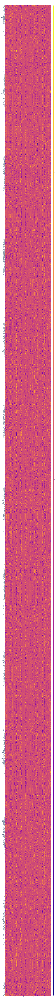

In [55]:
%matplotlib inline
import plotly.graph_objects as go


fig = go.Figure(
    data=go.Heatmap(
        z=Z,
        y=indexes,
        #colorscale='RdBu', reversescale=True
))

fig.update_layout(
    autosize=False,
    width=1200,
    height=20000,
)


fig.show()



Si tenemos que $Z \in \mathbb{R}^{W \times n}$, siendo $W$ la cantidad de palabras de nuestro vocabulario

Calculando la SVD truncada

$$Z = U \Sigma V^T$$

con $U \in \mathbb{R}^{W \times k}, \Sigma \in \mathbb{k \times k}, V \in \mathbb{R}^{n \times k}$

- $U$ me guarda "representaciones" de las palabras
- $V$ me guarda "representaciones" de las neuronas

(1003, 1003)


True

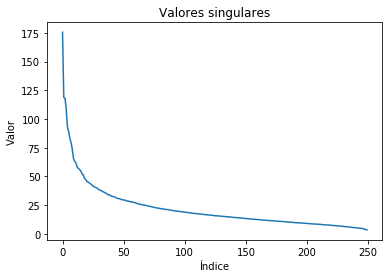

In [57]:
import matplotlib.pyplot as plt

U, s, Vh = np.linalg.svd(Z)

print(U.shape)
plt.plot(s)
plt.title("Valores singulares")
plt.ylabel("Valor")
plt.xlabel("Índice")
np.allclose(Z , (U[:, :len(s)] @ np.diag(s) @ Vh))

Corto en la dimensión 25, parece guardar bastante información hasta ahí

In [58]:
from sklearn.manifold import TSNE

U_trunc = U[:, :25]

tsne = TSNE(2)

U_tsne = tsne.fit_transform(U_trunc)

True


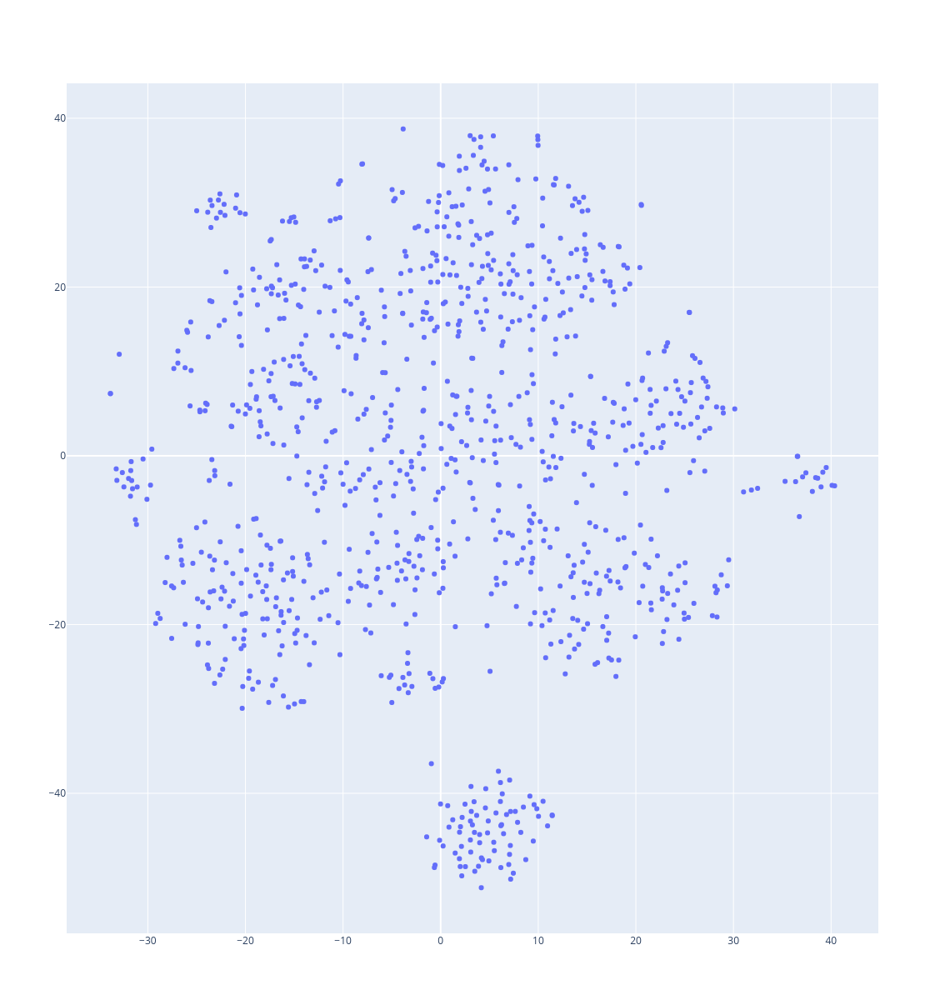

In [59]:
import plotly.graph_objects as go

print(U.shape[0] == len(indexes))
fig = go.Figure(data=go.Scatter(
    x=U_tsne[:, 0], 
    y=U_tsne[:, 1],
    text=indexes,
    mode='markers'))


fig.update_layout(
    autosize=False,
    width=1200,
    height=1200,
)

fig.show()

In [67]:
from sklearn.cluster.bicluster import SpectralBiclustering

num_clusters = 10

cluster = SpectralBiclustering(num_clusters)

cluster.fit(abs(avgs))

SpectralBiclustering(init='k-means++', method='bistochastic',
           mini_batch=False, n_best=3, n_clusters=10, n_components=6,
           n_init=10, n_jobs=None, n_svd_vecs=None, random_state=None,
           svd_method='randomized')

In [68]:
for i in range(num_clusters):
    print("="*80)
    print("="*80)
    print("Cluster número {}".format(i))
    
    print(" -- ".join(avgs.index[cluster.row_labels_ == i]))

Cluster número 0
abaten -- abrasado -- abrieron -- abusa -- abusando -- acaban -- acentos -- acoge -- acostumbrados -- acusaciones -- acusan -- adapta -- admita -- afecta -- agarren -- agrede -- agredido -- agrediendo -- ahogan -- ahoguen -- amaaamos -- amamos -- amas -- ampliamos -- anoran -- antecedentes -- aplastara -- aplica -- aporta -- aportan -- apoyan -- aprovecha -- aprovechando -- aquellos -- arranquen -- arrastrando -- arrojado -- arrojando -- arruinadas -- arruinar -- asaltan -- asaltando -- asaltaron -- ataca -- atacan -- ataques -- atreve -- aumentan -- ayudas -- ayudemos -- basan -- basta -- bastante -- bloqueo -- buscado -- buscamos -- buscan -- buscar -- busques -- calcula -- califica -- callan -- cambiamos -- cambiando -- cantan -- cantidades -- capturan -- carece -- cesa -- chupas -- citar -- cobrado -- cobran -- coges -- colaboreos -- colocara -- comen -- conoces -- conquista -- consecuencias -- consigue -- consumen -- contestas -- continuan -- convertir -- cortan -